<a href="https://colab.research.google.com/github/ZhubairAbhel/PCVK/blob/main/Week5_Kelompok7_MariaF(15)_MarsaMH(16)_3D_PCVK_JS5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#<u>**Kelompok 7**</u>

###**Nama Anggota:**

1. Maria Fadilla (2141720063 / 15)
2. Marsa Mawaddah Herawati (2141720257 / 16)
3. Zhubair Abhel (2141720248 / 30)

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import library
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

## 1. Gamma Correction

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


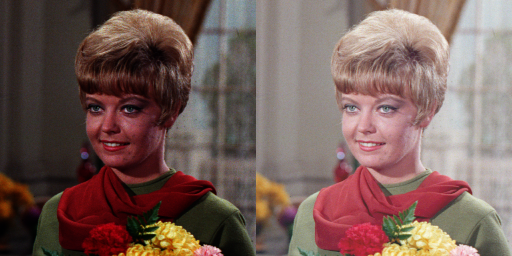

In [ ]:
print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
 gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
 print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/female.tiff')
gamma_img = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      gamma_img[y, x, c] = np.clip(255 * pow((original[y, x, c]) / 255, (1 / gamma)), 0, 255)

final_frame = cv.hconcat((original, gamma_img))
cv2_imshow(final_frame)

## 2. Bit Depth

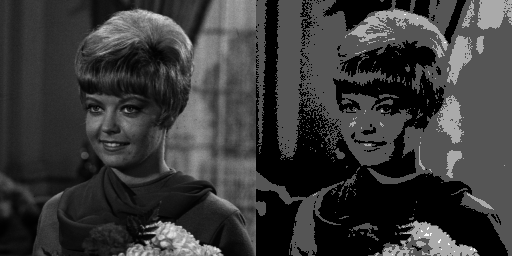

In [ ]:
bit_depth = 2
level = 255 / (pow(2, bit_depth) - 1)
original = cv.imread('/content/drive/MyDrive/PCVK/female.tiff', cv.IMREAD_GRAYSCALE)
depth_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    depth_image[y, x] = np.clip(round(original[y, x] / level) * level, 0, 255)

# Note:
# round(img / lvl), bukan round(img / lvl * lvl)

final_frame = cv.hconcat((original, depth_image))
cv2_imshow(final_frame)

## 3. Buat modul Average Denoising

In [ ]:
# Import Library
import glob
from math import sqrt, log10

# Read Image
original = cv.imread('/content/drive/MyDrive/PCVK/galaxy.jpg')

# Masukkan Image ke Array
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/noises/*.jpg'):
 n = cv.imread(img)
 cv_img.append(n)

### Jumlah Citra Average 5

Jumlah Citra = 5
Nilai PSNR = 27.539265607462458 dB
Nilai MSE = 114.5918682795699


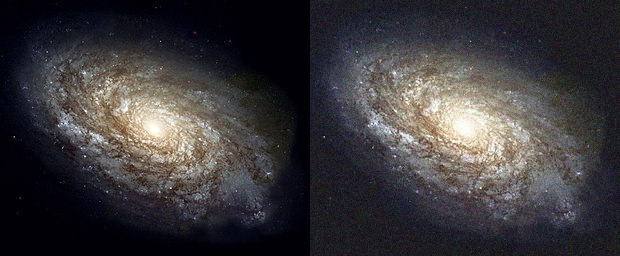

In [ ]:
# Jumlah Citra
jml_citra = 5

# Mengambil citra ke-5 (indeks ke-4) dari list cv_img
noise_image = cv_img[jml_citra - 1]

# Loop melalui citra-citra yang akan di-average
for i in range(jml_citra):
    # Hitung bobot alpha untuk citra ke-i
    alpha = 1.0 / (i + 1)

    # Hitung bobot beta untuk citra ke-i
    beta = 1.0 - alpha

    # Menggunakan cv.addWeighted untuk menghitung citra hasil denoising
    noise_image = cv.addWeighted(cv_img[i], alpha, noise_image, beta, 0.0)

# img1 = original image
# img2 = denoise image yang sudah dirata-ratakan

# Fungsi untuk menghitung nilai PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        # Mengatasi kasus jika MSE adalah 0 (tidak ada noise)
        # PSNR tidak memiliki arti jika MSE adalah 0
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Hitung nilai PSNR antara citra asli dan citra hasil denoising
psnr = PSNR(original, noise_image)

# Cetak hasil PSNR
print('Jumlah Citra =', jml_citra)
print('Nilai PSNR =', psnr, 'dB')

# Menampilkan citra asli dan citra hasil denoising dalam satu jendela grafik
final_frame = cv.hconcat((original, noise_image))
cv2_imshow(final_frame)


### Jumlah Citra Average 10

Jumlah Citra = 10
Nilai PSNR = 27.551233204715594 dB
Nilai MSE = 114.27652889784946


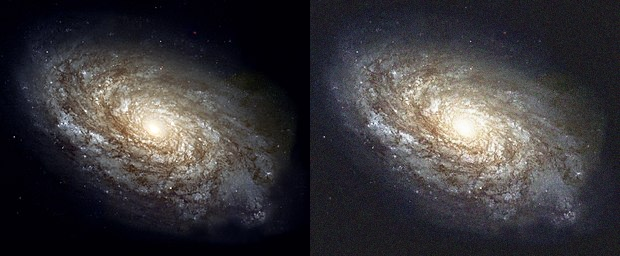

In [ ]:
# Jumlah Citra
jml_citra = 10

# Mengambil citra ke-5 (indeks ke-4) dari list cv_img
noise_image = cv_img[jml_citra - 1]

# Loop melalui citra-citra yang akan di-average
for i in range(jml_citra):
    # Hitung bobot alpha untuk citra ke-i
    alpha = 1.0 / (i + 1)

    # Hitung bobot beta untuk citra ke-i
    beta = 1.0 - alpha

    # Menggunakan cv.addWeighted untuk menghitung citra hasil denoising
    noise_image = cv.addWeighted(cv_img[i], alpha, noise_image, beta, 0.0)

# img1 = original image
# img2 = denoise image yang sudah dirata-ratakan

# Fungsi untuk menghitung nilai PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        # Mengatasi kasus jika MSE adalah 0 (tidak ada noise)
        # PSNR tidak memiliki arti jika MSE adalah 0
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Hitung nilai PSNR antara citra asli dan citra hasil denoising
psnr = PSNR(original, noise_image)

# Cetak hasil PSNR
print('Jumlah Citra =', jml_citra)
print('Nilai PSNR =', psnr, 'dB')

# Menampilkan citra asli dan citra hasil denoising dalam satu jendela grafik
final_frame = cv.hconcat((original, noise_image))
cv2_imshow(final_frame)

### Jumlah Citra 20

Jumlah Citra = 20
Nilai PSNR = 27.53518024419103 dB
Nilai MSE = 114.69971438172043


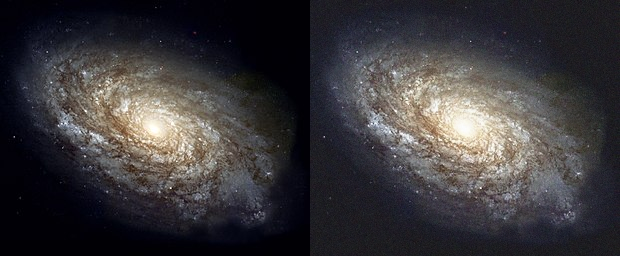

In [ ]:
# Jumlah Citra
jml_citra = 20

# Mengambil citra ke-5 (indeks ke-4) dari list cv_img
noise_image = cv_img[jml_citra - 1]

# Loop melalui citra-citra yang akan di-average
for i in range(jml_citra):
    # Hitung bobot alpha untuk citra ke-i
    alpha = 1.0 / (i + 1)

    # Hitung bobot beta untuk citra ke-i
    beta = 1.0 - alpha

    # Menggunakan cv.addWeighted untuk menghitung citra hasil denoising
    noise_image = cv.addWeighted(cv_img[i], alpha, noise_image, beta, 0.0)

# img1 = original image
# img2 = denoise image yang sudah dirata-ratakan

# Fungsi untuk menghitung nilai PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        # Mengatasi kasus jika MSE adalah 0 (tidak ada noise)
        # PSNR tidak memiliki arti jika MSE adalah 0
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Hitung nilai PSNR antara citra asli dan citra hasil denoising
psnr = PSNR(original, noise_image)

# Cetak hasil PSNR
print('Jumlah Citra =', jml_citra)
print('Nilai PSNR =', psnr, 'dB')

# Menampilkan citra asli dan citra hasil denoising dalam satu jendela grafik
final_frame = cv.hconcat((original, noise_image))
cv2_imshow(final_frame)

### Jumlah Citra 40

Jumlah Citra = 40
Nilai PSNR = 27.51277665197747 dB


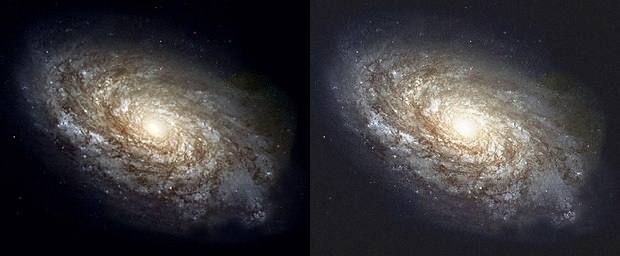

In [ ]:
# Jumlah Citra
jml_citra = 40

# Mengambil citra ke-5 (indeks ke-4) dari list cv_img
noise_image = cv_img[jml_citra - 1]

# Loop melalui citra-citra yang akan di-average
for i in range(jml_citra):
    # Hitung bobot alpha untuk citra ke-i
    alpha = 1.0 / (i + 1)

    # Hitung bobot beta untuk citra ke-i
    beta = 1.0 - alpha

    # Menggunakan cv.addWeighted untuk menghitung citra hasil denoising
    noise_image = cv.addWeighted(cv_img[i], alpha, noise_image, beta, 0.0)

# img1 = original image
# img2 = denoise image yang sudah dirata-ratakan

# Fungsi untuk menghitung nilai PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        # Mengatasi kasus jika MSE adalah 0 (tidak ada noise)
        # PSNR tidak memiliki arti jika MSE adalah 0
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Hitung nilai PSNR antara citra asli dan citra hasil denoising
psnr = PSNR(original, noise_image)

# Cetak hasil PSNR
print('Jumlah Citra =', jml_citra)
print('Nilai PSNR =', psnr, 'dB')

# Menampilkan citra asli dan citra hasil denoising dalam satu jendela grafik
final_frame = cv.hconcat((original, noise_image))
cv2_imshow(final_frame)

### Jumlah Citra 80

Jumlah Citra = 80
Nilai PSNR = 27.517565575058327 dB


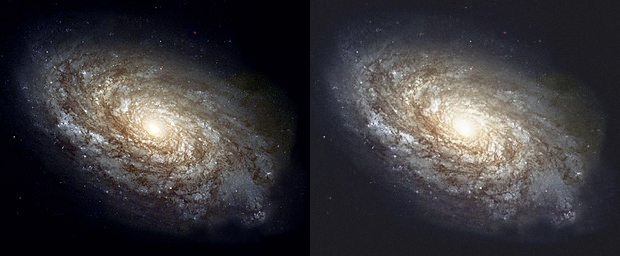

In [ ]:
# Jumlah Citra
jml_citra = 80

# Mengambil citra ke-5 (indeks ke-4) dari list cv_img
noise_image = cv_img[jml_citra - 1]

# Loop melalui citra-citra yang akan di-average
for i in range(jml_citra):
    # Hitung bobot alpha untuk citra ke-i
    alpha = 1.0 / (i + 1)

    # Hitung bobot beta untuk citra ke-i
    beta = 1.0 - alpha

    # Menggunakan cv.addWeighted untuk menghitung citra hasil denoising
    noise_image = cv.addWeighted(cv_img[i], alpha, noise_image, beta, 0.0)

# img1 = original image
# img2 = denoise image yang sudah dirata-ratakan

# Fungsi untuk menghitung nilai PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        # Mengatasi kasus jika MSE adalah 0 (tidak ada noise)
        # PSNR tidak memiliki arti jika MSE adalah 0
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Hitung nilai PSNR antara citra asli dan citra hasil denoising
psnr = PSNR(original, noise_image)

# Cetak hasil PSNR
print('Jumlah Citra =', jml_citra)
print('Nilai PSNR =', psnr, 'dB')

# Menampilkan citra asli dan citra hasil denoising dalam satu jendela grafik
final_frame = cv.hconcat((original, noise_image))
cv2_imshow(final_frame)

### Jumlah Citra 100

Jumlah Citra = 100
Nilai PSNR = 27.519172458447144 dB


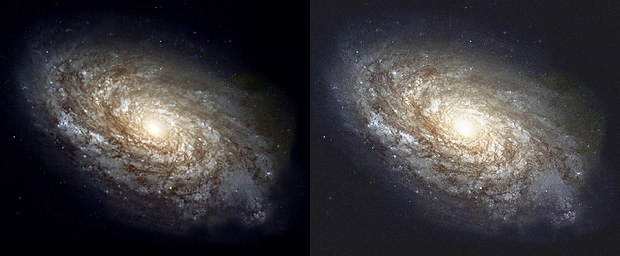

In [ ]:
# Jumlah Citra
jml_citra = 100

# Mengambil citra ke-5 (indeks ke-4) dari list cv_img
noise_image = cv_img[jml_citra - 1]

# Loop melalui citra-citra yang akan di-average
for i in range(jml_citra):
    # Hitung bobot alpha untuk citra ke-i
    alpha = 1.0 / (i + 1)

    # Hitung bobot beta untuk citra ke-i
    beta = 1.0 - alpha

    # Menggunakan cv.addWeighted untuk menghitung citra hasil denoising
    noise_image = cv.addWeighted(cv_img[i], alpha, noise_image, beta, 0.0)

# img1 = original image
# img2 = denoise image yang sudah dirata-ratakan

# Fungsi untuk menghitung nilai PSNR antara dua citra
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        # Mengatasi kasus jika MSE adalah 0 (tidak ada noise)
        # PSNR tidak memiliki arti jika MSE adalah 0
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Hitung nilai PSNR antara citra asli dan citra hasil denoising
psnr = PSNR(original, noise_image)

# Cetak hasil PSNR
print('Jumlah Citra =', jml_citra)
print('Nilai PSNR =', psnr, 'dB')

# Menampilkan citra asli dan citra hasil denoising dalam satu jendela grafik
final_frame = cv.hconcat((original, noise_image))
cv2_imshow(final_frame)

## Kesimpulan

Makin besar jumlah citra maka hasil nilai PSNR akan semakin besar dan gambar yang dihasilkan akan semakin bagus dan jelas. Pada saat denoised dengan lima citra maka gambar yang dihasilkan akan pecah sedangkan pada 100 citra maka gambar yang dihasilkan

### No.4

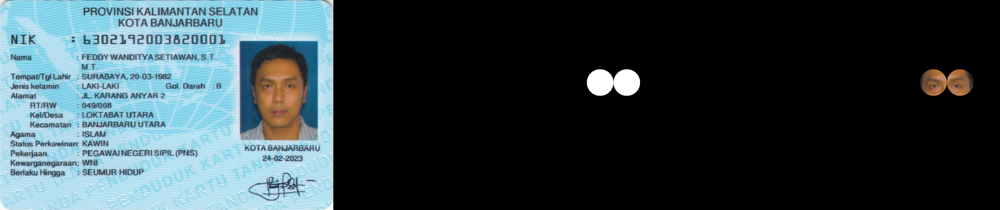

In [ ]:
ktp = cv.imread('/content/drive/MyDrive/PCVK/ktp.jpg')

face = np.zeros(ktp.shape, dtype=np.uint8)
# Draw the first circle on the mask
face = cv.circle(face, (1000, 310), 50, (255,255,255), thickness=-1)  # White circle on black background

# Draw the second circle on the mask
face1 = cv.circle(face, (1100, 310), 50, (255,255,255), thickness=-1)  # White circle on black background

faced = ktp & face

ktp_frame = cv.hconcat((ktp, face, faced))
cv2_imshow(ktp_frame)

### No.5

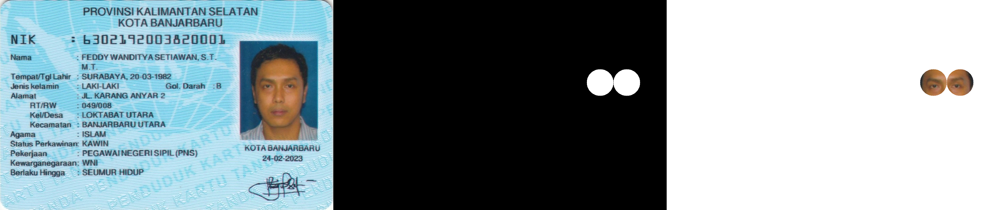

In [ ]:
# menggunakan operator and
ktp = cv.imread('/content/drive/MyDrive/PCVK/ktp.jpg')
face = np.zeros(ktp.shape, dtype=np.uint8)
# Draw the first circle on the mask
face = cv.circle(face, (1000, 310), 50, (255,255,255), thickness=-1)  # White circle on black background

# Draw the second circle on the mask
face1 = cv.circle(face, (1100, 310), 50, (255,255,255), thickness=-1)  # White circle on black background

result = ktp & face & face1
result[face==0] = 255

final_frame = cv.hconcat((ktp,face,result))
cv2_imshow(final_frame)

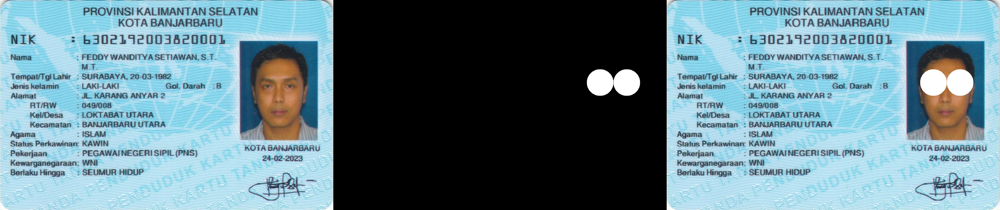

In [ ]:
# menggunakan operator or
ktp = cv.imread('/content/drive/MyDrive/PCVK/ktp.jpg')

face = np.zeros(ktp.shape, dtype=np.uint8)
# Draw the first circle on the mask
face = cv.circle(face, (1000, 310), 50, (255,255,255), thickness=-1)  # White circle on black background

# Draw the second circle on the mask
face1 = cv.circle(face, (1100, 310), 50, (255,255,255), thickness=-1)  # White circle on black background

result = ktp & face1

faced = ktp | face

final_frame = cv.hconcat((ktp,face,faced))
cv2_imshow(final_frame)

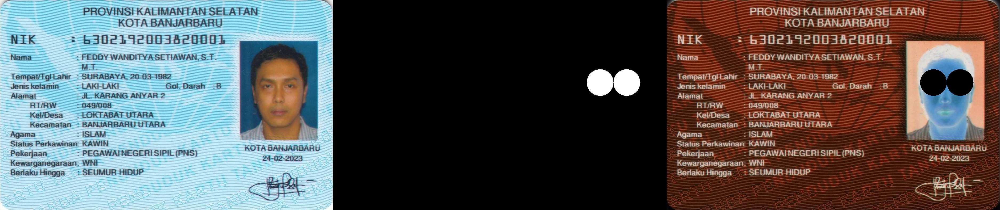

In [ ]:
# menggunakan operator not
ktp = cv.imread('/content/drive/MyDrive/PCVK/ktp.jpg')

face = np.zeros(ktp.shape, dtype=np.uint8)
# Draw the first circle on the mask
face = cv.circle(face, (1000, 310), 50, (255,255,255), thickness=-1)  # White circle on black background

# Draw the second circle on the mask
face1 = cv.circle(face, (1100, 310), 50, (255,255,255), thickness=-1)  # White circle on black background

# Use the bitwise 'AND' operator to overlay the circles on the original image
result_image = ~ktp & ~face

# Display the result image
final_frame = cv.hconcat([ktp, face, result_image])
cv2_imshow(final_frame)

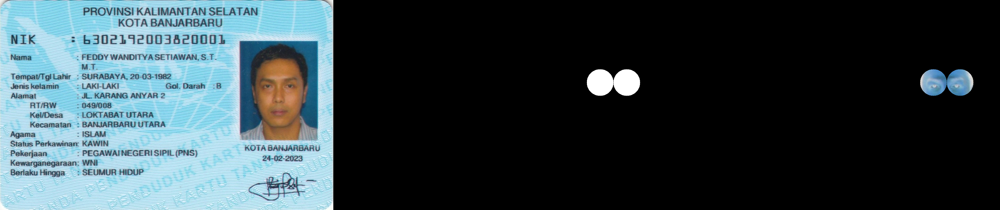

In [ ]:
# menggunakan operator nand
ktp = cv.imread('/content/drive/MyDrive/PCVK/ktp.jpg')

face = np.zeros(ktp.shape, dtype=np.uint8)
# Draw the first circle on the mask
face = cv.circle(face, (1000, 310), 50, (255,255,255), thickness=-1)  # White circle on black background

# Draw the second circle on the mask
face1 = cv.circle(face, (1100, 310), 50, (255,255,255), thickness=-1)  # White circle on black background

faced = ~ktp & face

final_frame = cv.hconcat((ktp, face, faced))
cv2_imshow(final_frame)

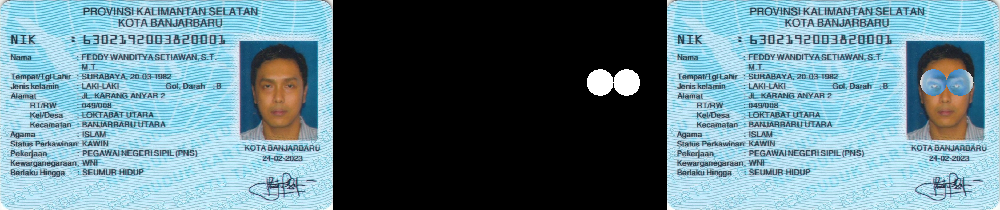

In [ ]:
# menggunakan operator xor
ktp = cv.imread('/content/drive/MyDrive/PCVK/ktp.jpg')

face = np.zeros(ktp.shape, dtype=np.uint8)
# Draw the first circle on the mask
face = cv.circle(face, (1000, 310), 50, (255,255,255), thickness=-1)  # White circle on black background

# Draw the second circle on the mask
face1 = cv.circle(face, (1100, 310), 50, (255,255,255), thickness=-1)  # White circle on black background

faced = cv.bitwise_xor(ktp, face)

final_frame = cv.hconcat((ktp, face, faced))
cv2_imshow(final_frame)

## Hasil Analisa

Pada operasi AND, piksel pada citra hasil akan bernilai 1 hanya jika kedua piksel yang bersesuaian pada citra input dan
masker memiliki nilai 1. Ini digunakan untuk memisahkan objek dari latar
belakang.

Operasi OR menghasilkan piksel dengan nilai 1 jika salah satu atau kedua piksel pada citra input dan masker memiliki nilai 1. Ini berguna untuk menonjolkan objek pada latar belakang yang berbeda.

Operasi NOT menghasilkan citra hasil dengan membalik nilai piksel pada citra input. Piksel hitam menjadi putih dan sebaliknya. Ini digunakan untuk mengubah kontrast atau membalik citra.

Operator NAND menghasilkan 1 (atau TRUE) hanya jika kedua inputnya adalah 0 (atau FALSE). Dalam bahasa logika, operator NAND merupakan negasi dari operator AND.

Operator XOR menghasilkan 1 (atau TRUE) jika jumlah input yang benar-benar berbeda (satu TRUE dan satu FALSE). Dalam bahasa lain, XOR menghasilkan TRUE jika salah satu inputnya TRUE, tetapi tidak keduanya TRUE. Dalam logika digital, operator XOR sering digunakan dalam pemrosesan data, pengkodean, dan deteksi kesalahan.